In [39]:
import os
import glob

import numpy as np
import xarray as xr

import csv
import pop_tools
import gsw

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cmocean.cm as cmo
import cartopy
import matplotlib.ticker as ticker
from matplotlib import animation, gridspec
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FuncFormatter

ccrs = cartopy.crs
cfeature = cartopy.feature

nature_coast = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m',linewidth=0.5, edgecolor='black', facecolor='whitesmoke')

In [2]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic':[
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [10.0, 80.0], 'TLONG': [260.0, 360.0]}}   
    ],
    'NordicSea': [
        {'match': {'REGION_MASK': [9]}, 'bounds': {'TLAT': [10.0, 70.0], 'TLONG': [260.0, 360.0]}}
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}}]}
contour_mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
contour_mask = contour_mask.sum('region')  

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
grid_name = 'POP_gx1v7'
region_defs = {
        'subzero_Atlantic':[
            {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [10.0, 90.0], 'TLONG': [260.0, 360.0]}}
        ],
        'superzero_Atlantic':[
            {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [10.0, 90.0], 'TLONG': [0, 20.0]}}
        ],
        'Mediterranean': [
            {'match': {'REGION_MASK': [7]}}
        ],
        'LabradorSea': [
            {'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [10.0, 70.0]}}
        ],
        'subzero_NordicSea': [
            {'match': {'REGION_MASK': [9]}, 'bounds': {'TLAT': [10.0, 90.0], 'TLONG': [260.0, 360.0]}}
        ],
        'superzero_NordicSea':[
            {'match': {'REGION_MASK': [9]}, 'bounds': {'TLAT': [10.0, 90.0], 'TLONG': [0, 20.0]}}
        ],
    }
mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs)
mask = mask.sum('region')

# the vision for density anomalies

In [46]:
# Adjust visualization parameters for consistency
vmin_upper = -0.5
vmax_upper = 0.5
contour_levels_upper = np.arange(vmin_upper, vmax_upper, 0.05)
years_upper = [41, 44, 45]

vmin_lower = -0.03
vmax_lower = 0.03
contour_levels_lower = np.arange(vmin_lower, vmax_lower, 0.004)
years_lower = [51, 54, 57]

vmin_center = -0.05
vmax_center = 0.05
depth_range = (0, 400000)
fontsize = 12
num_subplots = 4
data_titles = [
    (anom_lab_region, 'Labrador Sea'),
    (anom_irm_region, 'Irminger Sea'),
    (anom_esp_region, 'Eastern Subpolar'),
    (anom_csp_region, 'Central Subpolar')
]
start_time = 20

/tmp/ipykernel_229022/3018830159.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_229022/3018830159.py:65: UserWarning: tight_layout not applied: number of rows in subplot specifications must be multiples of one another.
  plt.tight_layout()


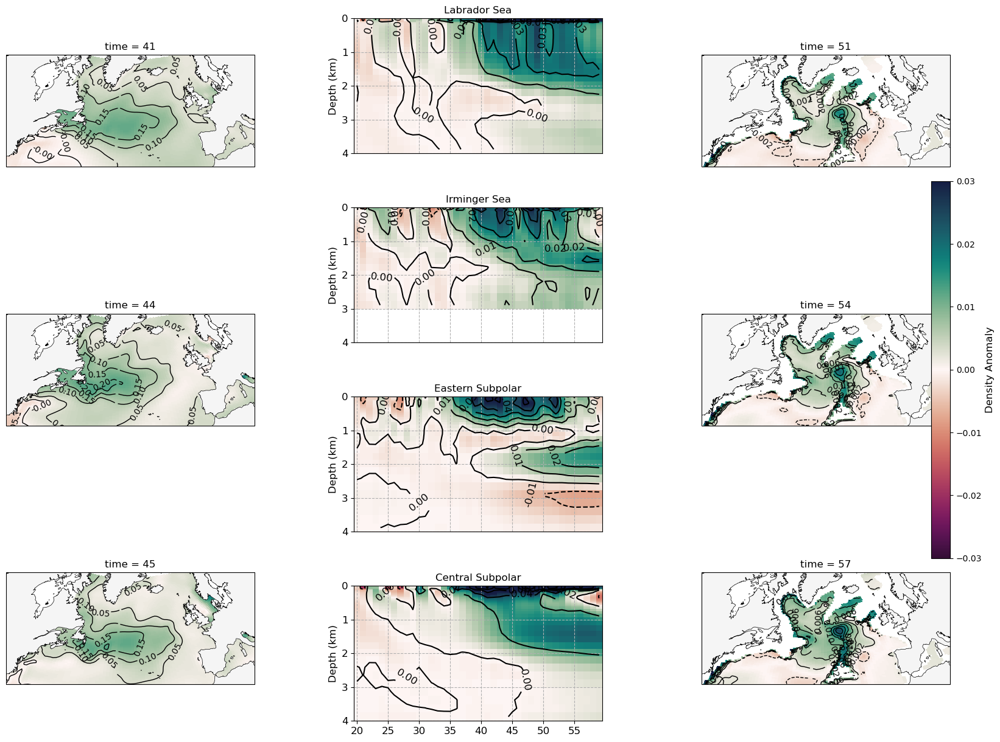

In [51]:
# Create a combined figure with appropriate space for all subplots
fig = plt.figure(figsize=(20, 15))

# Left column plots
for i, year in enumerate(years_upper):
    ax = fig.add_subplot(3, 3, 1 + i * 3, projection=ccrs.Orthographic(central_latitude=20, central_longitude=-35))
    pc = ds_upper_dens_anom['DENS2'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin_upper, vmax=vmax_upper, add_colorbar=False
    )
    ax.set_extent([-80, 10, 35, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    
    cs = ax.contour(ds_upper_dens_anom.TLONG.where(contour_mask==1), ds_upper_dens_anom.TLAT.where(contour_mask==1), 
                    ds_upper_dens_anom['DENS2'].isel(time=year).where(contour_mask==1), 
                    levels=contour_levels_upper, 
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    ax.clabel(cs, fmt='%1.2f', inline=True)

# Middle column plots
for i, (data, title) in enumerate(data_titles):
    ax = fig.add_subplot(4, 3, 2 + i * 3)
    pcm = ax.pcolormesh(
        ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
        data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, cmap=cmo.curl_r, vmin=vmin_center, vmax=vmax_center
    )
    contour = ax.contour(
        ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
        data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, colors='k'
    )
    ax.clabel(contour, inline=True, fontsize=fontsize, fmt='%1.2f')
    ax.invert_yaxis()
    ax.set_ylabel('Depth (km)', fontsize=fontsize)
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x / 100000)}'))
    ax.grid(True, linestyle='--')
    ax.set_title(title, fontsize=fontsize)

    # Hide x-ticks for all plots except the bottom plot
    if i != num_subplots - 1:
        ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        
# Right column plots
for i, year in enumerate(years_lower):
    ax = fig.add_subplot(3, 3, 3 + i * 3, projection=ccrs.Orthographic(central_latitude=20, central_longitude=-35))
    pc = ds_lower_dens_anom['DENS2'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin_lower, vmax=vmax_lower, add_colorbar=False
    )
    ax.set_extent([-80, 10, 35, 69], crs=ccrs.PlateCarree())  # Adjust extent for consistency
    ax.add_feature(nature_coast)
    
    cs = ax.contour(ds_lower_dens_anom.TLONG.where(contour_mask == 1), ds_lower_dens_anom.TLAT.where(contour_mask == 1), 
                    ds_lower_dens_anom['DENS2'].isel(time=year).where(contour_mask == 1), 
                    levels=contour_levels_lower, 
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    ax.clabel(cs, fmt='%1.3f', inline=True)

# Add the color bar on the right
cbar = fig.colorbar(pc, ax=fig.get_axes(), orientation='vertical', fraction=0.02, pad=0.02)
cbar.set_label('Density Anomaly', fontsize=fontsize)

# Adjust layout to ensure there are no overlaps
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
plt.show()


<Figure size 640x480 with 0 Axes>

# Temperature propagation

In [36]:
ds_temp = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_TEMP_3.0_40_20.nc')#.roll(nlon=+100)
replacement_value = 0

In [43]:
ds_upper_temp_anom = ds_temp - ds_temp.isel(time=slice(0,40)).mean('time')
ds_upper_temp_anom = ds_upper_temp_anom.sel(z_t=slice(5.0000000e+02, 5.5000000e+03)).mean('z_t')
ds_upper_temp_anom = ds_upper_temp_anom.roll(nlon=+100).where(mask==1)

In [44]:
ds_upper_temp_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_upper_temp_anom['TLAT']), np.isinf(ds_upper_temp_anom['TLAT']) | np.ma.getmask(ds_upper_temp_anom['TLAT'])),
    replacement_value,
    ds_upper_temp_anom['TLAT'])
ds_upper_temp_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_upper_temp_anom['TLONG']), np.isinf(ds_upper_temp_anom['TLONG']) | np.ma.getmask(ds_upper_temp_anom['TLONG'])),
    replacement_value,
    ds_upper_temp_anom['TLONG'])

/tmp/ipykernel_70084/2012158295.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


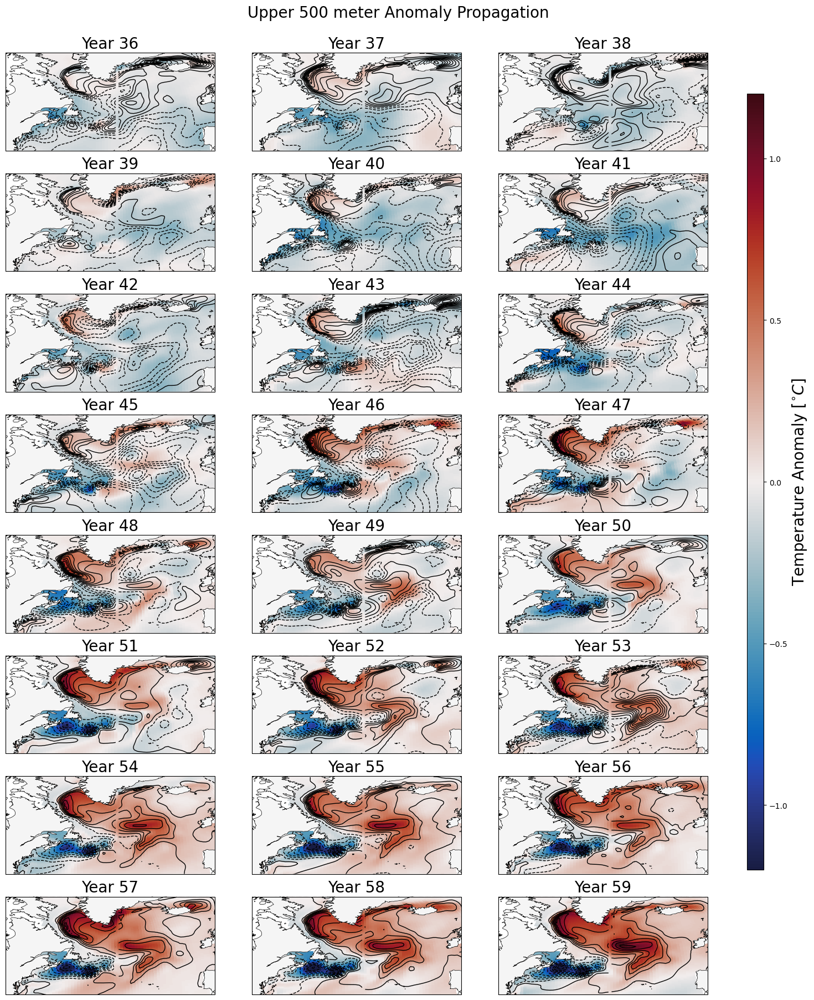

In [81]:
vmin = -1.2
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes.flatten()):
    pc = ds_upper_temp_anom['TEMP'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.balance,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs = ax.contour(ds_upper_temp_anom.TLONG, ds_upper_temp_anom.TLAT, 
                    ds_upper_temp_anom['TEMP'].isel(time=32+i), 
                    levels = 20,
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    
    ax.set_title(f'Year {36+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Temperature Anomaly [$^{\circ}C$]', fontsize=20)

fig.suptitle('Upper 500 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

#plt.show()
plt.savefig('Figure_upper_temp_anomalies.png', bbox_inches='tight', dpi=300)

In [46]:
ds_lower_temp_anom = ds_temp - ds_temp.isel(time=slice(0,40)).mean('time')
ds_lower_temp_anom = ds_lower_temp_anom.sel(z_t=slice(2.1864566e+05,2.8893847e+05)).mean('z_t')
ds_lower_temp_anom = ds_lower_temp_anom.roll(nlon=+100).where(mask==1)

In [47]:
ds_lower_temp_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_lower_temp_anom['TLAT']), np.isinf(ds_lower_temp_anom['TLAT']) | np.ma.getmask(ds_lower_temp_anom['TLAT'])),
    replacement_value,
    ds_lower_temp_anom['TLAT'])
ds_lower_temp_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_lower_temp_anom['TLONG']), np.isinf(ds_lower_temp_anom['TLONG']) | np.ma.getmask(ds_lower_temp_anom['TLONG'])),
    replacement_value,
    ds_lower_temp_anom['TLONG'])

/tmp/ipykernel_70084/748099213.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


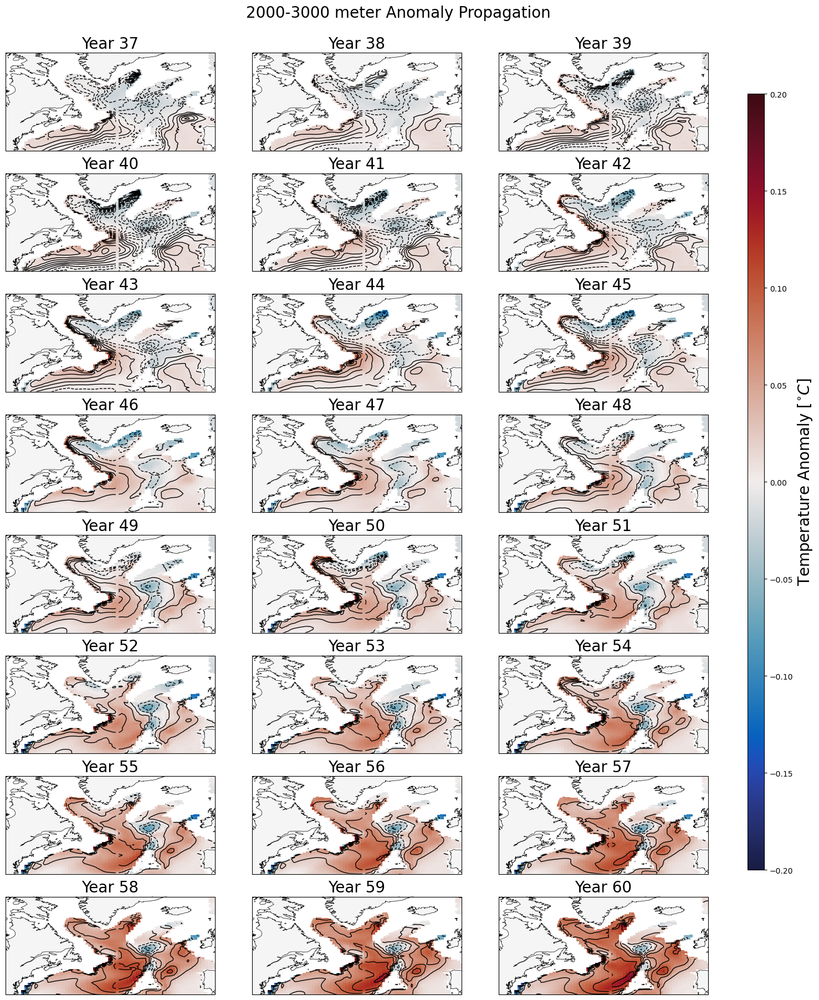

In [82]:
vmin = -0.2
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes.flatten()):
    pc = ds_lower_temp_anom['TEMP'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.balance,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs = ax.contour(ds_lower_temp_anom.TLONG, ds_lower_temp_anom.TLAT, 
                    ds_lower_temp_anom['TEMP'].isel(time=32+i), 
                    levels = 20,
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    
    ax.set_title(f'Year {37+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Temperature Anomaly [$^{\circ}C$]', fontsize=20)

fig.suptitle('2000-3000 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

#plt.show()
plt.savefig('Figure_lower_temp_anomalies.png', bbox_inches='tight', dpi=300)

# Salinity propagation

In [50]:
ds_salt = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_SALT_3.0_40_20.nc')#.roll(nlon=+100)
replacement_value = 0

In [51]:
ds_upper_salt_anom = ds_salt - ds_salt.isel(time=slice(0,40)).mean('time')
ds_upper_salt_anom = ds_upper_salt_anom.sel(z_t=slice(5.0000000e+02, 5.5000000e+03)).mean('z_t')
ds_upper_salt_anom = ds_upper_salt_anom.roll(nlon=+100).where(mask==1)

In [52]:
ds_upper_salt_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_upper_salt_anom['TLAT']), np.isinf(ds_upper_salt_anom['TLAT']) | np.ma.getmask(ds_upper_salt_anom['TLAT'])),
    replacement_value,
    ds_upper_salt_anom['TLAT'])
ds_upper_salt_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_upper_salt_anom['TLONG']), np.isinf(ds_upper_salt_anom['TLONG']) | np.ma.getmask(ds_upper_salt_anom['TLONG'])),
    replacement_value,
    ds_upper_salt_anom['TLONG'])

/tmp/ipykernel_70084/2635616961.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


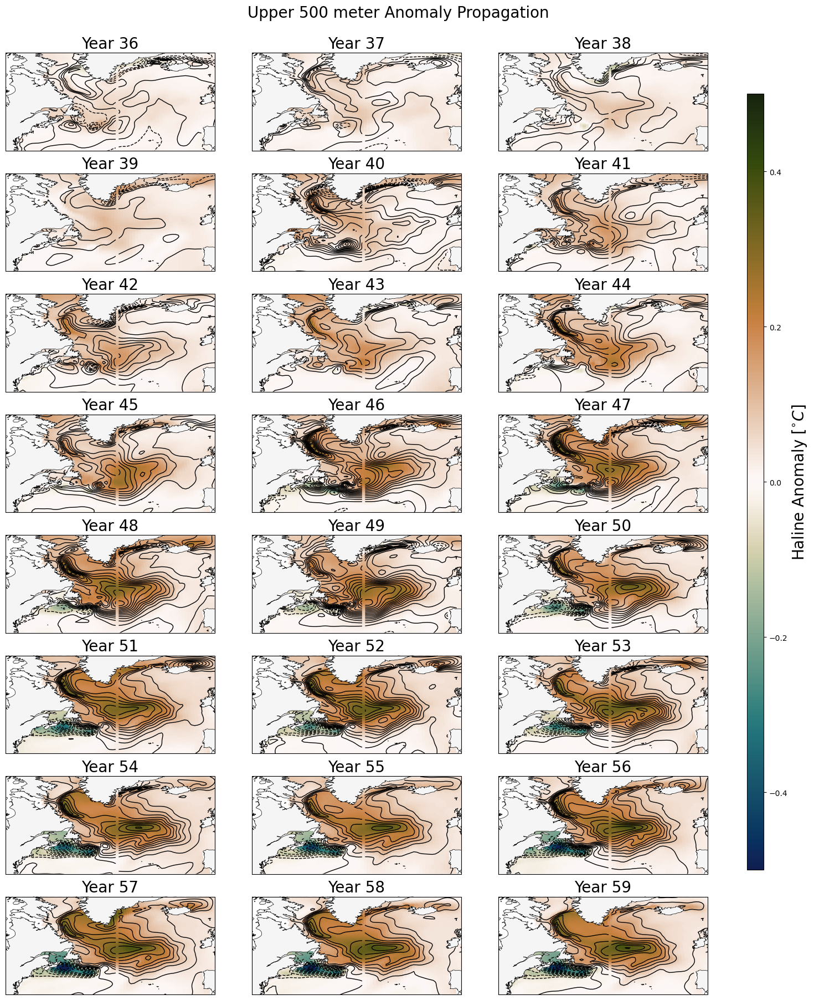

In [83]:
vmin = -0.5
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes.flatten()):
    pc = ds_upper_salt_anom['SALT'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.tarn_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs = ax.contour(ds_upper_salt_anom.TLONG, ds_upper_salt_anom.TLAT, 
                    ds_upper_salt_anom['SALT'].isel(time=32+i), 
                    levels = 20,
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    
    ax.set_title(f'Year {36+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Haline Anomaly [$^{\circ}C$]', fontsize=20)

fig.suptitle('Upper 500 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

#plt.show()
plt.savefig('Figure_upper_salt_anomalies.png', bbox_inches='tight', dpi=300)

In [54]:
ds_lower_salt_anom = ds_salt - ds_salt.isel(time=slice(0,40)).mean('time')
ds_lower_salt_anom = ds_lower_salt_anom.sel(z_t=slice(2.1864566e+05,2.8893847e+05)).mean('z_t')
ds_lower_salt_anom = ds_lower_salt_anom.roll(nlon=+100).where(mask==1)

In [55]:
ds_lower_salt_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_lower_salt_anom['TLAT']), np.isinf(ds_lower_salt_anom['TLAT']) | np.ma.getmask(ds_lower_salt_anom['TLAT'])),
    replacement_value,
    ds_lower_salt_anom['TLAT'])
ds_lower_salt_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_lower_salt_anom['TLONG']), np.isinf(ds_lower_salt_anom['TLONG']) | np.ma.getmask(ds_lower_salt_anom['TLONG'])),
    replacement_value,
    ds_lower_salt_anom['TLONG'])

/tmp/ipykernel_70084/358813.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


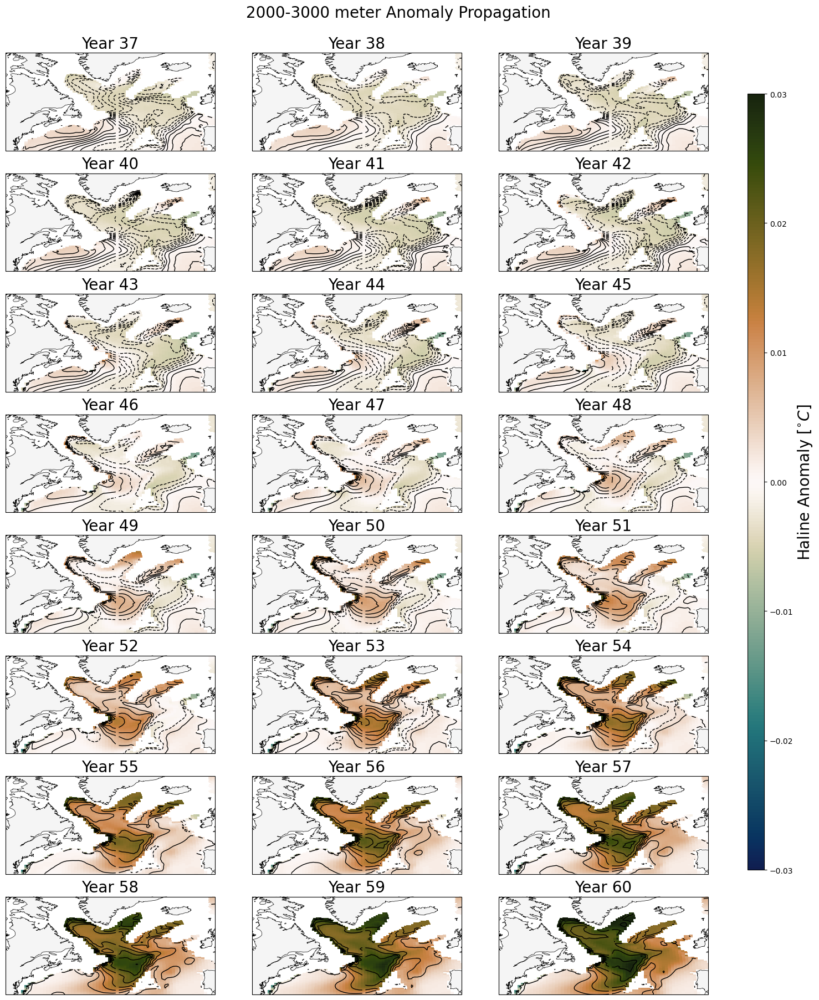

In [84]:
vmin = -0.03
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes.flatten()):
    pc = ds_lower_salt_anom['SALT'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.tarn_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs = ax.contour(ds_lower_salt_anom.TLONG, ds_lower_salt_anom.TLAT, 
                    ds_lower_salt_anom['SALT'].isel(time=32+i), 
                    levels = 20,
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    
    ax.set_title(f'Year {37+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Haline Anomaly [$^{\circ}C$]', fontsize=20)

fig.suptitle('2000-3000 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

#plt.show()
plt.savefig('Figure_lower_salt_anomalies.png', bbox_inches='tight', dpi=300)

# Density propagation

In [4]:
ds_temp = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_TEMP_3.0_40_20.nc')
ds_salt = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_SALT_3.0_40_20.nc')
CT = gsw.conversions.CT_from_pt(ds_salt['SALT'], ds_temp['TEMP'])
sigma2 = gsw.density.sigma2(ds_salt['SALT'], CT)
sigma2 = xr.DataArray(sigma2, name='DENS2', dims=ds_temp['TEMP'].dims, coords=ds_temp['TEMP'].coords)
ds_dens = ds_temp
ds_dens = ds_dens.drop_vars('TEMP')
ds_dens['DENS2'] = sigma2

replacement_value = 0

## plots

## upper density

In [5]:
ds_upper_dens_anom = ds_dens - ds_dens.isel(time=slice(0,40)).mean('time')
#ds_upper_dens_anom = ds_upper_dens_anom.sel(z_t=slice(5.0000000e+02, 5.5000000e+03)).mean('z_t')
ds_upper_dens_anom = ds_upper_dens_anom.sel(z_t=slice(0, 5e+03)).mean('z_t')
ds_upper_dens_anom = ds_upper_dens_anom.roll(nlon=+100).where(mask==1)

In [6]:
ds_upper_dens_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_upper_dens_anom['TLAT']), np.isinf(ds_upper_dens_anom['TLAT']) | np.ma.getmask(ds_upper_dens_anom['TLAT'])),
    replacement_value,
    ds_upper_dens_anom['TLAT'])
ds_upper_dens_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_upper_dens_anom['TLONG']), np.isinf(ds_upper_dens_anom['TLONG']) | np.ma.getmask(ds_upper_dens_anom['TLONG'])),
    replacement_value,
    ds_upper_dens_anom['TLONG'])

### all 60 years

/tmp/ipykernel_230770/2613152619.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


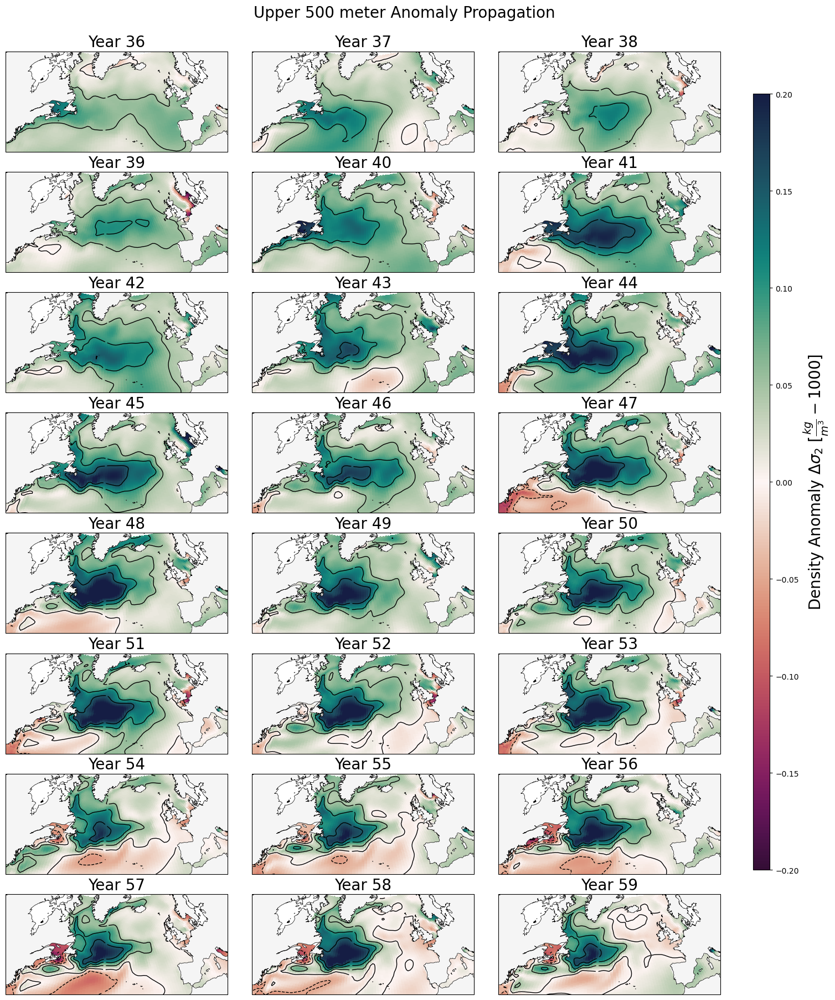

In [17]:
vmin = -0.2
vmax = -vmin

# Define the figure and axes with Orthographic projection
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), 
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})

for i, ax in enumerate(axes.flatten()):
    pc = ds_upper_dens_anom['DENS2'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, 10, 35, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    contour_levels = np.arange(vmin, vmax, 0.05)
    cs = ax.contour(ds_upper_dens_anom.TLONG.where(contour_mask==1), ds_upper_dens_anom.TLAT.where(contour_mask==1), 
                    ds_upper_dens_anom['DENS2'].isel(time=36+i).where(contour_mask==1), 
                    levels=contour_levels, 
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    #ax.clabel(cs, fmt='%1.2f', inline=True)
    ax.set_title(f'Year {36+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Density Anomaly $\Delta\sigma_2$ [$\frac{kg}{m^3} -1000$]', fontsize=20)

fig.suptitle('Upper 500 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

plt.show()
#plt.savefig('Figure_upper_dens_anomalies.png', bbox_inches='tight', dpi=300)

### 3 specific years

/tmp/ipykernel_101209/2563772884.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


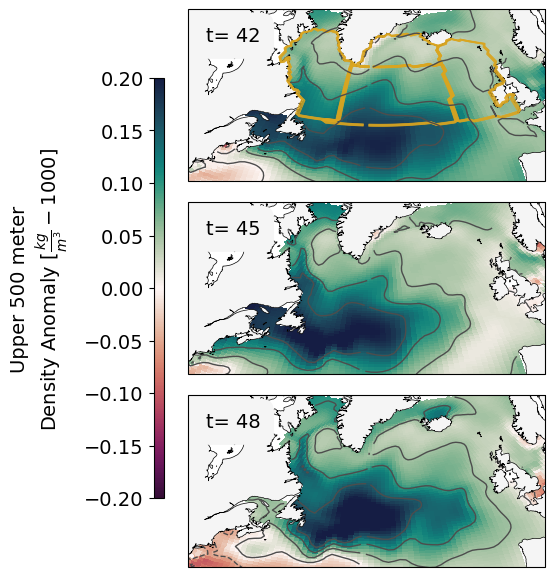

In [88]:
# Settings
vmin = -0.2
vmax = -vmin
contour_levels = np.arange(vmin, vmax, 0.05)
years = [41, 44, 47]
fontsize = 14

# Create the plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(5, 6), 
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})
plt.rc('font', size=fontsize)

for i, (ax, year) in enumerate(zip(axes, years)):
    
    pc = ds_upper_dens_anom['DENS2'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-75, -5,40, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)  # Assuming nature_coast is predefined
    
    if i == 0:
        color='goldenrod'
        ax.contour(ds_dens.TLONG, ds_dens.TLAT, lab_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors=color, linewidths=0.5)
        ax.contour(ds_dens.TLONG, ds_dens.TLAT, irm_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors=color, linewidths=0.5)
        ax.contour(ds_dens.TLONG, ds_dens.TLAT, esp_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors=color, linewidths=0.5)
        ax.contour(ds_dens.TLONG, ds_dens.TLAT, csp_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors=color, linewidths=0.5)

    cs = ax.contour(ds_upper_dens_anom.TLONG.where(contour_mask==1), ds_upper_dens_anom.TLAT.where(contour_mask==1), 
                    ds_upper_dens_anom['DENS2'].isel(time=year).where(contour_mask==1), 
                    levels=contour_levels, 
                    linewidths=1, colors='#4d4d4d', transform=ccrs.PlateCarree())
    #ax.clabel(cs, inline=True, fontsize=fontsize-2, fmt='%1.2f', colors='black')
    
    # Remove default title
    ax.set_title('')
    
    # Add year annotation
    ax.text(0.05, 0.9, 't= '+str(years[i]+1), transform=ax.transAxes, fontsize=fontsize, 
            verticalalignment='top', bbox={'boxstyle': 'round,pad=0.7', 'facecolor': 'whitesmoke', 'edgecolor': 'none'})

# Fine-tune the colorbar location and add it to the left of the plot
cbar_ax = fig.add_axes([0.02, 0.15, 0.02, 0.7])  # Adjust position as necessary
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.set_label('Upper 500 meter' + '\n' + r'Density Anomaly [$\frac{kg}{m^3} -1000$]', fontsize=fontsize, labelpad=10)
cbar.ax.yaxis.set_label_position('left')
cbar.ax.yaxis.set_ticks_position('left')

# Adjust layout to prevent overlap and ensure a neat presentation
plt.tight_layout()
plt.subplots_adjust(right=0.85)  # Adjust to make room for the broader colorbar
plt.savefig('Figure_Density_Anomaly_1.png', bbox_inches='tight', dpi=300)
#plt.show()

## lower density

In [8]:
ds_lower_dens_anom = ds_dens - ds_dens.isel(time=slice(0,40)).mean('time')
#ds_lower_dens_anom = ds_lower_dens_anom.sel(z_t=slice(1.9689442e+05,2.8893847e+05)).mean('z_t')
ds_lower_dens_anom = ds_lower_dens_anom.sel(z_t=slice(2e+05,3e+05)).mean('z_t')
ds_lower_dens_anom = ds_lower_dens_anom.roll(nlon=+100).where(mask==1)

In [9]:
ds_lower_dens_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_lower_dens_anom['TLAT']), np.isinf(ds_lower_dens_anom['TLAT']) | np.ma.getmask(ds_lower_dens_anom['TLAT'])),
    replacement_value,
    ds_lower_dens_anom['TLAT'])
ds_lower_dens_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_lower_dens_anom['TLONG']), np.isinf(ds_lower_dens_anom['TLONG']) | np.ma.getmask(ds_lower_dens_anom['TLONG'])),
    replacement_value,
    ds_lower_dens_anom['TLONG'])

### all 60 years

/tmp/ipykernel_78495/668025090.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


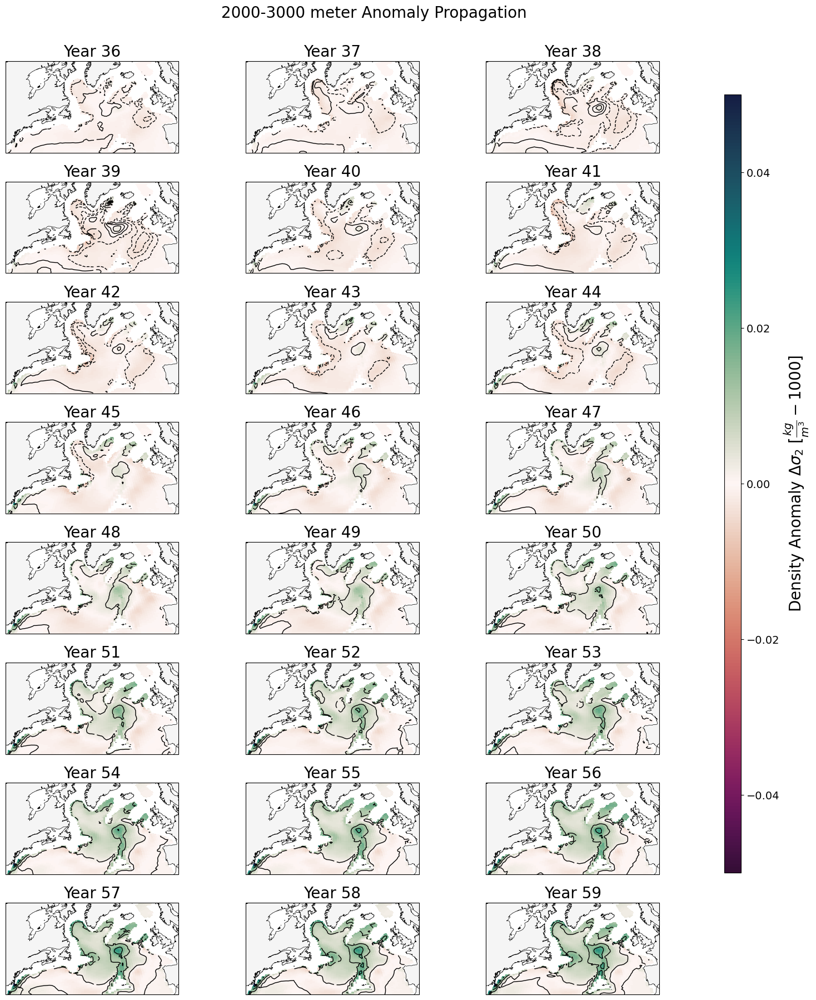

In [27]:
vmin = -0.05
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), 
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})

for i, ax in enumerate(axes.flatten()):
    pc = ds_lower_dens_anom['DENS2'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    contour_levels = np.arange(vmin, vmax, 0.004)
    cs = ax.contour(ds_lower_dens_anom.TLONG.where(contour_mask==1), ds_lower_dens_anom.TLAT.where(contour_mask==1), 
                    ds_lower_dens_anom['DENS2'].isel(time=32+i).where(contour_mask==1), 
                    #levels=contour_levels, 
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    #ax.clabel(cs, fmt='%1.3f', inline=True)
    ax.set_title(f'Year {36+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Density Anomaly $\Delta\sigma_2$ [$\frac{kg}{m^3} -1000$]', fontsize=20)

fig.suptitle('2000-3000 meter Anomaly Propagation', fontsize=20, y=0.93)  # Lower the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

#plt.show()
plt.savefig('Figure_lower_dens_anomalies.png', bbox_inches='tight', dpi=300)

### 3 specfic years

/tmp/ipykernel_101209/1773733178.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


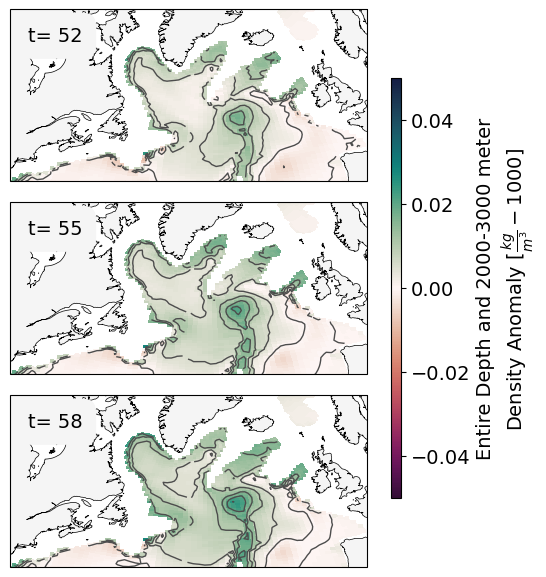

In [93]:
# Settings
vmin = -0.05
vmax = -vmin
contour_levels = np.arange(vmin, vmax, 0.005)
years = [51, 54, 57]
fontsize = 14

# Create the plot
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(5, 6), 
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})
plt.rc('font', size=fontsize)

for i, (ax, year) in enumerate(zip(axes, years)):
    pc = ds_lower_dens_anom['DENS2'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-75, -5,40, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    
    cs = ax.contour(ds_lower_dens_anom.TLONG.where(contour_mask==1), ds_lower_dens_anom.TLAT.where(contour_mask==1), 
                    ds_lower_dens_anom['DENS2'].isel(time=year).where(contour_mask==1), 
                    levels=contour_levels, 
                    linewidths=1, colors='#4d4d4d', transform=ccrs.PlateCarree())
    
    # Remove default title
    ax.set_title('')
    
    # Add year annotation
    ax.text(0.05, 0.9, 't= '+str(years[i]+1), transform=ax.transAxes, fontsize=fontsize, 
            verticalalignment='top', bbox={'boxstyle': 'round,pad=0.7', 'facecolor': 'whitesmoke', 'edgecolor': 'none'})

# Fine-tune the colorbar location and add it to the right of the plot
cbar_ax = fig.add_axes([0.85, 0.15, 0.02, 0.7])  # Adjust position as necessary
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.set_label('Entire Depth and 2000-3000 meter'+'\n'+r'Density Anomaly [$\frac{kg}{m^3} -1000$]', fontsize=fontsize)

# Adjust layout to prevent overlap and ensure a neat presentation
plt.tight_layout()
plt.subplots_adjust(right=0.85)  # Adjust to make room for the broader colorbar
plt.savefig('Figure_Density_Anomaly_3.png', bbox_inches='tight', dpi=300)
#plt.show()

## see what happens at other depths

In [30]:
ds_dens.z_t.values

array([5.0000000e+02, 1.5000000e+03, 2.5000000e+03, 3.5000000e+03,
       4.5000000e+03, 5.5000000e+03, 6.5000000e+03, 7.5000000e+03,
       8.5000000e+03, 9.5000000e+03, 1.0500000e+04, 1.1500000e+04,
       1.2500000e+04, 1.3500000e+04, 1.4500000e+04, 1.5500000e+04,
       1.6509840e+04, 1.7547904e+04, 1.8629127e+04, 1.9766027e+04,
       2.0971139e+04, 2.2257828e+04, 2.3640883e+04, 2.5137016e+04,
       2.6765420e+04, 2.8548365e+04, 3.0511922e+04, 3.2686799e+04,
       3.5109348e+04, 3.7822762e+04, 4.0878465e+04, 4.4337770e+04,
       4.8273672e+04, 5.2772801e+04, 5.7937289e+04, 6.3886262e+04,
       7.0756328e+04, 7.8700250e+04, 8.7882523e+04, 9.8470586e+04,
       1.1062042e+05, 1.2445669e+05, 1.4004972e+05, 1.5739464e+05,
       1.7640033e+05, 1.9689442e+05, 2.1864566e+05, 2.4139716e+05,
       2.6490012e+05, 2.8893847e+05, 3.1334047e+05, 3.3797934e+05,
       3.6276703e+05, 3.8764519e+05, 4.1257681e+05, 4.3753925e+05,
       4.6251903e+05, 4.8750834e+05, 5.1250281e+05, 5.3750000e

In [37]:
ds_other_dens_anom = ds_dens - ds_dens.isel(time=slice(0,40)).mean('time')
ds_other_dens_anom = ds_other_dens_anom.sel(z_t=slice(9.8470586e+04,1.9689442e+05)).mean('z_t') #1000-2000 meters
#ds_other_dens_anom = ds_other_dens_anom.sel(z_t=slice(1.4004972e+05,1.9689442e+05)).mean('z_t') #1500-2000 meters
ds_other_dens_anom = ds_other_dens_anom.roll(nlon=+100).where(mask==1)

In [38]:
ds_other_dens_anom['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_other_dens_anom['TLAT']), np.isinf(ds_other_dens_anom['TLAT']) | np.ma.getmask(ds_other_dens_anom['TLAT'])),
    replacement_value,
    ds_other_dens_anom['TLAT'])
ds_other_dens_anom['TLONG'] = xr.where(
    np.logical_or(np.isnan(ds_other_dens_anom['TLONG']), np.isinf(ds_other_dens_anom['TLONG']) | np.ma.getmask(ds_other_dens_anom['TLONG'])),
    replacement_value,
    ds_other_dens_anom['TLONG'])

/tmp/ipykernel_150873/1787089048.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar


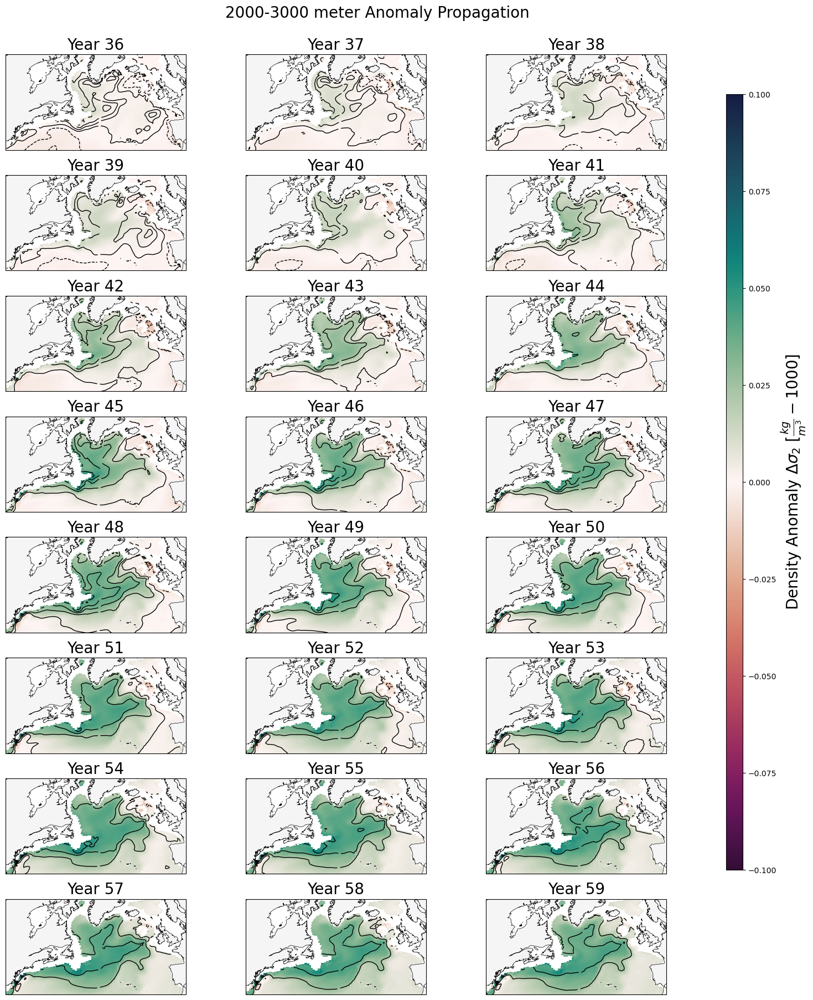

In [39]:
vmin = -0.1
vmax = -vmin

fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 20), 
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})

for i, ax in enumerate(axes.flatten()):
    pc = ds_other_dens_anom['DENS2'].isel(time=36+i).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap=cmo.curl_r,
        vmin=vmin, vmax=vmax, add_colorbar=False
    )
    ax.set_extent([-80, -5, 35, 69], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    contour_levels = np.arange(vmin, vmax, 0.004)
    cs = ax.contour(ds_other_dens_anom.TLONG.where(contour_mask==1), ds_other_dens_anom.TLAT.where(contour_mask==1), 
                    ds_other_dens_anom['DENS2'].isel(time=32+i).where(contour_mask==1), 
                    #levels=contour_levels, 
                    linewidths=1, colors='k', transform=ccrs.PlateCarree())
    #ax.clabel(cs, fmt='%1.3f', inline=True)
    ax.set_title(f'Year {36+i}', fontsize=20)

# Add a single colorbar for all plots, positioned to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(pc, cax=cbar_ax)
cbar.ax.set_ylabel(r'Density Anomaly $\Delta\sigma_2$ [$\frac{kg}{m^3} -1000$]', fontsize=20)

fig.suptitle('2000-3000 meter Anomaly Propagation', fontsize=20, y=0.93)  # other the title
plt.tight_layout(rect=[0, 0.03, 0.9, 0.93])  # Adjust to make room for the colorbar

plt.show()
#plt.savefig('Figure_other_dens_anomalies.png', bbox_inches='tight', dpi=300)

# Anomaly propagation and vvel 

In [2]:
ds_temp = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_TEMP_3.0_40_20.nc')
ds_salt = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_SALT_3.0_40_20.nc')
CT = gsw.conversions.CT_from_pt(ds_salt['SALT'], ds_temp['TEMP'])
sigma2 = gsw.density.sigma2(ds_salt['SALT'], CT)
sigma2 = xr.DataArray(sigma2, name='DENS2', dims=ds_temp['TEMP'].dims, coords=ds_temp['TEMP'].coords)
ds_dens = ds_temp
ds_dens = ds_dens.drop_vars('TEMP')
ds_dens['DENS2'] = sigma2

ds_vvel = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Above_combined_VVEL_3.0_40_20.nc')
replacement_value = 0

### density anomaly propagation

In [11]:
def compute_anomalies(ds, mask, replacement_value, depth_slice):
    ds_anom = (ds - ds.isel(time=slice(0, 40)).mean('time')
              ).sel(z_t=slice(*depth_slice)).mean('z_t').roll(nlon=100).where(mask == 1)

    for coord in ['TLAT', 'TLONG']:
        ds_anom[coord] = xr.where(
            np.logical_or(np.isnan(ds_anom[coord]), np.isinf(ds_anom[coord]) | np.ma.getmask(ds_anom[coord])),
            replacement_value,
            ds_anom[coord]
        )
    
    return ds_anom

# Define the depth slice for selection
upper_depth_slice = (5.0000000e+02, 5.5000000e+03)
lower_depth_slice = (2.1864566e+05,2.8893847e+05)

# Compute anomalies for dens and vertical velocity
ds_upper_dens_anom = compute_anomalies(ds_dens, mask, replacement_value, upper_depth_slice)
ds_lower_dens_anom = compute_anomalies(ds_dens, mask, replacement_value, lower_depth_slice)
ds_upper_vvel_anom = compute_anomalies(ds_vvel, mask, replacement_value, upper_depth_slice)
ds_lower_vvel_anom = compute_anomalies(ds_vvel, mask, replacement_value, lower_depth_slice)

/tmp/ipykernel_191688/2084659472.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])  # Adjust to make room for the colorbars


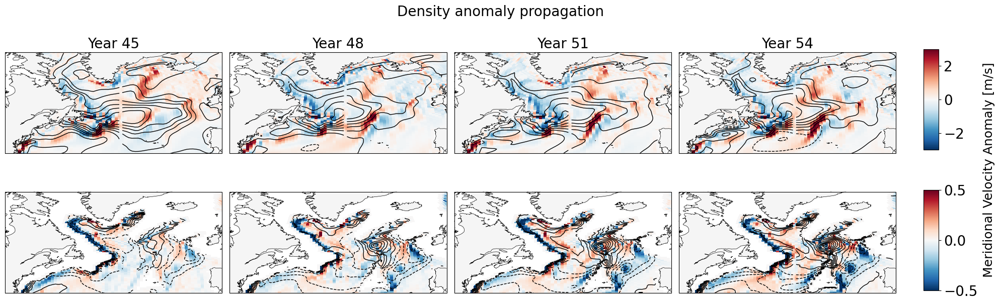

In [12]:
# Unified font size
font_size = 20

# Years to plot
years = [45, 48, 51, 54]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Define vmin and vmax for color mapping
vmin_upper = -3
vmax_upper = -vmin_upper
vmin_lower = -0.5
vmax_lower = -vmin_lower

for col, year in enumerate(years):
    # First row: pcolormesh upper vvel anomaly and contours of upper dens anomaly
    ax = axes[0, col]
    pc_upper = ds_upper_vvel_anom['VVEL'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap='RdBu_r',
        vmin=vmin_upper, vmax=vmax_upper, add_colorbar=False, add_labels=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs_upper = ax.contour(ds_upper_dens_anom.TLONG, ds_upper_dens_anom.TLAT,
                          ds_upper_dens_anom['DENS2'].isel(time=year),
                          levels=10, linewidths=1, colors='k', transform=ccrs.PlateCarree())
    ax.set_title(f'Year {year}', fontsize=font_size)

    # Second row: pcolormesh lower vvel anomaly and contours of lower dens anomaly
    ax = axes[1, col]
    pc_lower = ds_lower_vvel_anom['VVEL'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap='RdBu_r',
        vmin=vmin_lower, vmax=vmax_lower, add_colorbar=False, add_labels=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs_lower = ax.contour(ds_lower_dens_anom.TLONG, ds_lower_dens_anom.TLAT,
                          ds_lower_dens_anom['DENS2'].isel(time=year),
                          levels=20, linewidths=1, colors='k', transform=ccrs.PlateCarree())

# Add colorbars for each row
# First row colorbar
cbar_ax_upper = fig.add_axes([0.92, 0.52, 0.015, 0.25])  # [left, bottom, width, height]
cbar_upper = fig.colorbar(pc_upper, cax=cbar_ax_upper)
cbar_upper.ax.tick_params(labelsize=font_size)

# Second row colorbar
cbar_ax_lower = fig.add_axes([0.92, 0.17, 0.015, 0.25])  # [left, bottom, width, height]
cbar_lower = fig.colorbar(pc_lower, cax=cbar_ax_lower)
cbar_lower.ax.tick_params(labelsize=font_size)

# Add one title for both colorbars
fig.text(0.985, 0.47, r'Meridional Velocity Anomaly [m/s]', va='center', ha='center', rotation='vertical', fontsize=font_size-2)

fig.suptitle('Density anomaly propagation', fontsize=font_size, y=0.88)
plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])  # Adjust to make room for the colorbars

# Show the figure
#plt.show()
# Save the figure
plt.savefig('Figure_vvel_anomalies.png', bbox_inches='tight', dpi=300)

### salt anomaly propagation

In [91]:
def compute_anomalies(ds, mask, replacement_value, depth_slice):
    ds_anom = (ds - ds.isel(time=slice(0, 40)).mean('time')
              ).sel(z_t=slice(*depth_slice)).mean('z_t').roll(nlon=100).where(mask == 1)

    for coord in ['TLAT', 'TLONG']:
        ds_anom[coord] = xr.where(
            np.logical_or(np.isnan(ds_anom[coord]), np.isinf(ds_anom[coord]) | np.ma.getmask(ds_anom[coord])),
            replacement_value,
            ds_anom[coord]
        )
    
    return ds_anom

# Define the depth slice for selection
upper_depth_slice = (5.0000000e+02, 5.5000000e+03)
lower_depth_slice = (2.1864566e+05,2.8893847e+05)

# Compute anomalies for salt and vertical velocity
ds_upper_salt_anom = compute_anomalies(ds_salt, mask, replacement_value, upper_depth_slice)
ds_lower_salt_anom = compute_anomalies(ds_salt, mask, replacement_value, lower_depth_slice)
ds_upper_vvel_anom = compute_anomalies(ds_vvel, mask, replacement_value, upper_depth_slice)
ds_lower_vvel_anom = compute_anomalies(ds_vvel, mask, replacement_value, lower_depth_slice)


/tmp/ipykernel_70084/2771761326.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])  # Adjust to make room for the colorbars


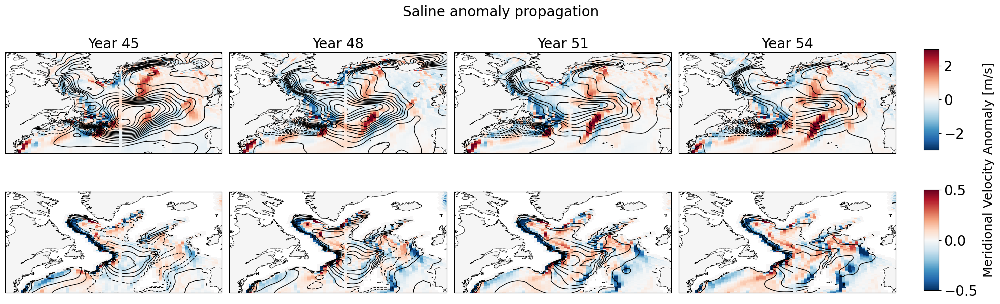

In [144]:
# Unified font size
font_size = 20

# Years to plot
years = [45, 48, 51, 54]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Define vmin and vmax for color mapping
vmin_upper = -3
vmax_upper = -vmin_upper
vmin_lower = -0.5
vmax_lower = -vmin_lower

for col, year in enumerate(years):
    # First row: pcolormesh upper vvel anomaly and contours of upper salt anomaly
    ax = axes[0, col]
    pc_upper = ds_upper_vvel_anom['VVEL'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap='RdBu_r',
        vmin=vmin_upper, vmax=vmax_upper, add_colorbar=False, add_labels=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs_upper = ax.contour(ds_upper_salt_anom.TLONG, ds_upper_salt_anom.TLAT,
                          ds_upper_salt_anom['SALT'].isel(time=year),
                          levels=20, linewidths=1, colors='k', transform=ccrs.PlateCarree())
    ax.set_title(f'Year {year}', fontsize=font_size)

    # Second row: pcolormesh lower vvel anomaly and contours of lower salt anomaly
    ax = axes[1, col]
    pc_lower = ds_lower_vvel_anom['VVEL'].isel(time=year).plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT', cmap='RdBu_r',
        vmin=vmin_lower, vmax=vmax_lower, add_colorbar=False, add_labels=False
    )
    ax.set_extent([-80, -5, 35, 70], crs=ccrs.PlateCarree())
    ax.add_feature(nature_coast)
    cs_lower = ax.contour(ds_lower_salt_anom.TLONG, ds_lower_salt_anom.TLAT,
                          ds_lower_salt_anom['SALT'].isel(time=year),
                          levels=20, linewidths=1, colors='k', transform=ccrs.PlateCarree())

# Add colorbars for each row
# First row colorbar
cbar_ax_upper = fig.add_axes([0.92, 0.52, 0.015, 0.25])  # [left, bottom, width, height]
cbar_upper = fig.colorbar(pc_upper, cax=cbar_ax_upper)
cbar_upper.ax.tick_params(labelsize=font_size)

# Second row colorbar
cbar_ax_lower = fig.add_axes([0.92, 0.17, 0.015, 0.25])  # [left, bottom, width, height]
cbar_lower = fig.colorbar(pc_lower, cax=cbar_ax_lower)
cbar_lower.ax.tick_params(labelsize=font_size)

# Add one title for both colorbars
fig.text(0.985, 0.47, r'Meridional Velocity Anomaly [m/s]', va='center', ha='center', rotation='vertical', fontsize=font_size-2)

fig.suptitle('Saline anomaly propagation', fontsize=font_size, y=0.88)
plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])  # Adjust to make room for the colorbars

# Show the figure
#plt.show()

# Density depth propagation

In [36]:
grid_name = 'POP_gx1v7'
region_defs_lab = {'LabradorSea': [{'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [45.0, 65.0]}}]} 
lab_mask3d = pop_tools.region_mask_3d(grid_name, region_defs=region_defs_lab, mask_name='lab')
lab_mask3d = lab_mask3d.sum('region') # apparently necessary even in this case

region_defs_irm = {'NorthAtlantic': [{'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [60., 65.],'TLONG': [300., 340.]}}]}
irm_mask3d = pop_tools.region_mask_3d(grid_name, region_defs=region_defs_irm, mask_name='irm')
irm_mask3d = irm_mask3d.sum('region')

region_defs_esp = {'NorthAtlantic': [{'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50., 65.],'TLONG': [340., 355.]}}],}
esp_mask3d = pop_tools.region_mask_3d(grid_name, region_defs=region_defs_esp, mask_name='esp')
esp_mask3d = esp_mask3d.sum('region')

region_defs_csp = {'NorthAtlantic': [{'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50., 65.],'TLONG': [310., 340.]}}],}
csp_mask3d = pop_tools.region_mask_3d(grid_name, region_defs=region_defs_csp, mask_name='csp')
csp_mask3d = csp_mask3d.sum('region')

#region_defs_nac = {'NorthAtlantic': [{'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [43., 50.],'TLONG': [305., 320.]}}],}
#nac_mask3d = pop_tools.region_mask_3d(grid_name, region_defs=region_defs_nac, mask_name='nac')
#nac_mask3d = nac_mask3d.sum('region')

lab_mask3d = lab_mask3d.roll(nlon=-100)
irm_mask3d = irm_mask3d.roll(nlon=-100)
esp_mask3d = esp_mask3d.roll(nlon=-100)
csp_mask3d = csp_mask3d.roll(nlon=-100)
#nac_mask3d = nac_mask3d.roll(nlon=-100)

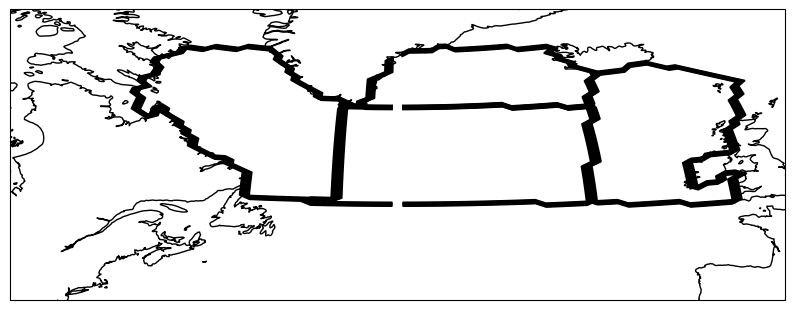

In [69]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-80, 0, 40, 70], crs=ccrs.PlateCarree())

# Add coastlines
ax.coastlines()

# Plot the contour for the mask
ax.contour(ds_dens.TLONG, ds_dens.TLAT, lab_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors='black')
ax.contour(ds_dens.TLONG, ds_dens.TLAT, irm_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors='black')
ax.contour(ds_dens.TLONG, ds_dens.TLAT, esp_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors='black')
ax.contour(ds_dens.TLONG, ds_dens.TLAT, csp_mask3d.roll(nlon=+100), transform=ccrs.PlateCarree(), colors='black')

# Show the plot
plt.show()

In [12]:
lab_region = ds_dens.DENS2.where(lab_mask3d == 1).mean(dim=['nlat', 'nlon'])
irm_region = ds_dens.DENS2.where(irm_mask3d == 1).mean(dim=['nlat', 'nlon'])
esp_region = ds_dens.DENS2.where(esp_mask3d == 1).mean(dim=['nlat', 'nlon'])
csp_region = ds_dens.DENS2.where(csp_mask3d == 1).mean(dim=['nlat', 'nlon'])
#nac_region = ds_dens.DENS2.where(nac_mask3d == 1).mean(dim=['nlat', 'nlon'])

anom_lab_region = lab_region - lab_region.isel(time=slice(0,40)).mean('time')
anom_irm_region = irm_region - irm_region.isel(time=slice(0,40)).mean('time')
anom_esp_region = esp_region - esp_region.isel(time=slice(0,40)).mean('time')
anom_csp_region = csp_region - csp_region.isel(time=slice(0,40)).mean('time')
#anom_nac_region = nac_region - nac_region.isel(time=slice(0,40)).mean('time')

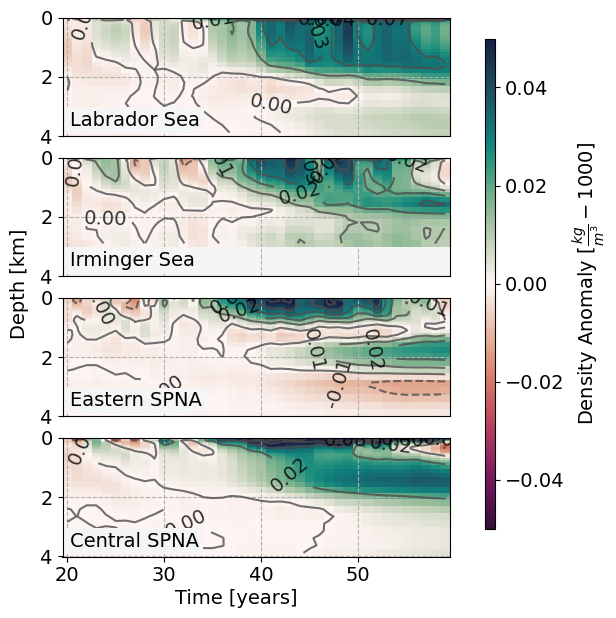

In [21]:
# Settings
vmin, vmax = -0.05, 0.05
fontsize = 14
num_subplots = 4

# Create a figure with 4 subplots of equal height
fig, axes = plt.subplots(num_subplots, 1, figsize=(5, 7))

# Define your data arrays and their corresponding titles
data_titles = [
    (anom_lab_region, 'Labrador Sea'),
    (anom_irm_region, 'Irminger Sea'),
    (anom_esp_region, 'Eastern SPNA'),
    (anom_csp_region, 'Central SPNA')
]

depth_range = (0, 400000)
start_time = 20  # Starting year

# Loop to create each subplot
for i, (data, title) in enumerate(data_titles):
    axes[i].set_facecolor('whitesmoke')

    pc = axes[i].pcolormesh(
        ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
        data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, cmap=cmo.curl_r, vmin=vmin, vmax=vmax
    )
    contour = axes[i].contour(
        ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
        data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, colors='#4d4d4d', alpha=0.8
    )
    axes[i].clabel(contour, inline=True, fontsize=fontsize, fmt='%1.2f', colors='black')
    axes[i].invert_yaxis()
    axes[i].tick_params(axis='both', which='major', labelsize=fontsize)
    axes[i].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x/100000)}'))
    axes[i].grid(True, linestyle='--')  # Add y grid lines

    # Hide x-ticks for all plots except the bottom plot
    if i != num_subplots - 1:
        axes[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    
    # Add title in a box with whitesmoke background and edged corners
    axes[i].text(0.02, 0.05, title, transform=axes[i].transAxes, fontsize=fontsize, 
                 verticalalignment='bottom', bbox={'boxstyle': 'square,pad=0.2', 'facecolor': 'whitesmoke', 'edgecolor': 'none'}, zorder=10)

fig.text(0.02, 0.5, 'Depth [km]', fontsize=fontsize, va='center', rotation='vertical')

fig.text(0.35, 0.05, 'Time [years]', fontsize=fontsize, va='center', rotation='horizontal')

plt.subplots_adjust(hspace=0.18)

# Add colorbar on the right and rotated by 90 degrees
cbar_ax = fig.add_axes([0.97, 0.15, 0.02, 0.7])  # Adjust position as necessary
cbar = fig.colorbar(pc, cax=cbar_ax, orientation='vertical')
cbar.set_label(r'Density Anomaly [$\frac{kg}{m^3} -1000$]', fontsize=fontsize)
cbar.ax.yaxis.set_label_position('right')
cbar.ax.yaxis.set_ticks_position('right')

#plt.tight_layout(pad=3.0)  # Adjust the padding
#plt.show()
plt.savefig('Figure_Density_Anomaly_2.png', bbox_inches='tight', dpi=300)

## Increase phenomena in bottom ocean

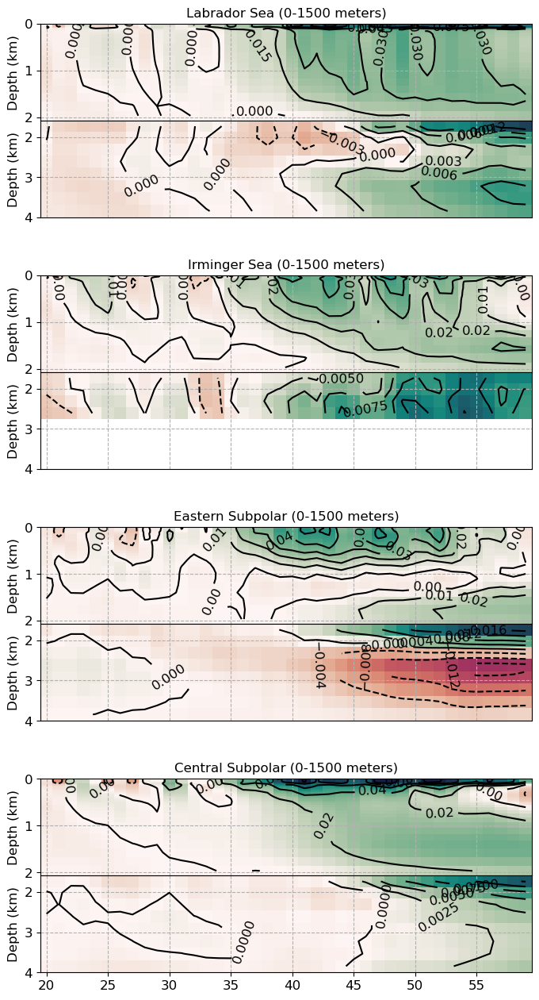

In [6]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# Set visualization parameters
vmin, vmax = -0.1, 0.1
vmin_lower, vmax_lower = -0.02, 0.02
fontsize = 12

# Number of subplots we want
num_subplots = 8

# Create a figure with 8 subplots of equal height
fig, axes = plt.subplots(num_subplots, 1, figsize=(8, 16))

# Define data arrays and their corresponding titles
data_titles = [
    (anom_lab_region, 'Labrador Sea (0-1500 meters)', 'Labrador Sea (1500-4000 meters)'),
    (anom_irm_region, 'Irminger Sea (0-1500 meters)', 'Irminger Sea (1500-4000 meters)'),
    (anom_esp_region, 'Eastern Subpolar (0-1500 meters)', 'Eastern Subpolar (1500-4000 meters)'),
    (anom_csp_region, 'Central Subpolar (0-1500 meters)', 'Central Subpolar (1500-4000 meters)')
]

depth_ranges = [(0, 200000), (200000, 400000)]

# Loop to create each subplot
for i, (data, title_upper, title_lower) in enumerate(data_titles):
    for j, (depth_range, title) in enumerate(zip(depth_ranges, [title_upper, title_lower])):
        index = 2 * i + j
        start_time = 20  # Starting year

        vmin_current, vmax_current = (vmin, vmax) if j == 0 else (vmin_lower, vmax_lower)

        pc = axes[index].pcolormesh(
            ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
            data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, cmap=cmo.curl_r, vmin=vmin_current, vmax=vmax_current
        )
        contour = axes[index].contour(
            ds_dens.time.sel(time=slice(start_time, None)), ds_dens.z_t.sel(z_t=slice(*depth_range)),
            data.sel(time=slice(start_time, None), z_t=slice(*depth_range)).T, colors='k'
        )
        axes[index].clabel(contour, inline=True, fontsize=fontsize)
        axes[index].invert_yaxis()
        axes[index].set_ylabel('Depth (km)', fontsize=fontsize)
        axes[index].tick_params(axis='both', which='major', labelsize=fontsize)
        axes[index].yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x/100000)}'))
        axes[index].grid(True, linestyle='--')  # Add y grid lines

        # Hide x-ticks for all plots except the bottom plot
        if index != num_subplots - 1:
            axes[index].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        
        # Add title only for every second panel starting with the first
        if j == 0:
            axes[index].set_title(title, fontsize=fontsize)

        if j == 1:
            axes[index].yaxis.set_major_locator(mticker.MultipleLocator(500 * 1e3))
            axes[index].yaxis.set_major_locator(plt.MaxNLocator(nbins=3))

# Adjust layout to remove gaps between specified panels
plt.subplots_adjust(hspace=0.3)

# Function to adjust panel spacing
def adjust_positions(axes, pairs):
    for i, j in pairs:
        pos_i = axes[i].get_position()
        pos_j = axes[j].get_position()
        axes[j].set_position([pos_j.x0, pos_i.y0 - pos_j.height, pos_j.width, pos_j.height])

# Adjust positions for specified pairs
adjust_positions(axes, [(0, 1), (2, 3), (4, 5), (6, 7)])

# Ensure the rest of the panels are evenly spaced
for idx in range(2, num_subplots, 2):
    if idx + 2 < num_subplots:
        pos_prev = axes[idx + 1].get_position()
        pos = axes[idx + 2].get_position()
        gap = pos_prev.y0 - pos.y0 - pos.height - 0.03